## Проект

Исследование рынка заведений общественного питания Москвы.

## Цель проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Цель проекта — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## План действий

1. Проанализировать категории заведений, количество посадочных мест, соотношение сетевых и несетевых заведений, топ-15 популярных сетей, количество заведений по районам, распределение средних рейтингов, топ-15 улиц по количеству заведений и значения средних чеков;

2. Сформировать рекомендации для открытия кофейни.

## Загрузить данные и изучить общую информацию

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math as mth
import scipy.stats as st
import numpy as np
import datetime as dt
import scipy.stats as stats
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
print('Количество заведений Москвы:', df['name'].nunique())

Количество заведений Москвы: 5614


**Вывод:**

Загруженный нами датасет несет информацию о заведениях общественного питания Москвы на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

В датасете 14 столбцов и 8406 строк.

Нам представлено 5614 уникальных заведений Москвы, а также описание каждого из них: адрес, категория заведения, дни и часы работы, долгота и широта, рейтинг заведения, категория цен, средняя стоимость заказа, число с оценкой среднего чека, число с оценкой одной чашки капучино, наличие сетевого заведения, административный район, количество посадочных мест.

Следующие столбцы хранят тип object: name, category, address, district, hours, price, avg_bill.

Следующие столбцы хранят тип float: lat, lng, rating,  middle_avg_bill, middle_coffee_cup, seats.

Следующие столбцы хранят тип int: chain.

## Предобработка данных

In [6]:
#приведем нужные столбцы к нижнему регистру
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [7]:
print('Количество явных дубликатов:', df.duplicated().sum())

Количество явных дубликатов: 0


In [8]:
print('Количество неявных дубликатов:', df.duplicated(subset = ['name', 'address']).sum())

Количество неявных дубликатов: 4


In [9]:
#удалим строки-дубликаты
df = df.drop_duplicates(subset=['name', 'address'])

In [10]:
print('Количество пропусков:', df.isna().sum())

Количество пропусков: name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64


In [11]:
print('Количество заведений Москвы после удаления дубликатов:', df['name'].nunique())

Количество заведений Москвы после удаления дубликатов: 5512


In [12]:
#создадим столбец с названиями улиц
df['street'] = df['address'].str.split(', ').str[1]

In [13]:
##pd.set_option('display.max_rows', None)

In [14]:
df['hours'].value_counts()

ежедневно, 10:00–22:00                               758
ежедневно, круглосуточно                             730
ежедневно, 11:00–23:00                               396
ежедневно, 10:00–23:00                               310
ежедневно, 12:00–00:00                               254
                                                    ... 
ежедневно, 18:00–05:00                                 1
пн-пт 09:00–23:00; сб,вс 11:30–23:00                   1
пн-пт 07:30–21:00; сб 08:00–20:00; вс 08:00–18:00      1
вт-чт 15:00–00:00; пт,сб 17:00–05:00                   1
пн-чт 08:00–18:00; пт 08:00–17:00; сб 10:00–17:00      1
Name: hours, Length: 1306, dtype: int64

In [15]:
#создадим столбец с обозначением, что заведение работает 24/7
df['is_24_7'] = df['hours'] == 'ежедневно, круглосуточно'

**Вывод:**

На этапе предобработки данных мы избавились от 4 неявных строк-дубликатов, заранее отфильтровав их по названию и адресу заведения. После удаления дубликатов количество уникальных заведений Москвы в данных сократилось до 5512 шт.

Наблюдаются пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats. Принято решение пропуски не удалять и не заменять, т.к. они занимают значительную долю в данных и есть вероятность сильно исказить этим выводы.

Далее мы создали 2 дополнительных столбца street (названия улиц) и is_24_7 (обозначения, что заведение работает ежедневно и круглосуточно).

## Анализ данных

**1. Узнаем какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и т.д. Построим визуализации.**

In [16]:
category = df.groupby('category')['name'].count().reset_index()
category.columns = ['category', 'count']
category = category.sort_values(by='count', ascending=False)
category

,category,count
3,кафе,2376
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


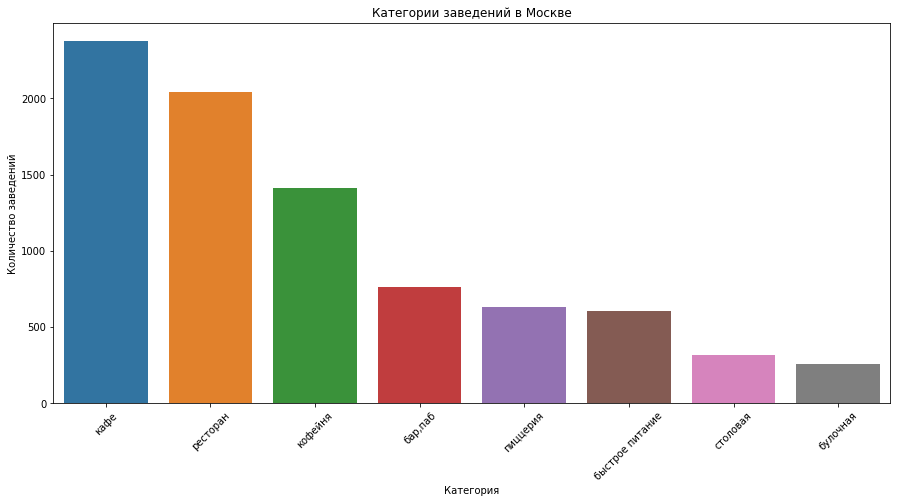

In [17]:
plt.figure(figsize=(15,7))

bar_category = sns.barplot(x='category', y='count', data=category)

bar_category.set_xlabel('Категория')
bar_category.set_ylabel('Количество заведений')
bar_category.set_title('Категории заведений в Москве')
plt.xticks(rotation=45)
plt.show()

Самую большую долю заведений в Москве занимают кафе (28,3%), вторую по величине - рестораны (24,3%), третью - кофейни (16,8%). Самую малую долю составляют столовые (3,75%) и булочные (3,05%).

**2. Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и т.д. Построим визуализации.**

In [18]:
df['seats'].value_counts()

40.0     253
100.0    213
60.0     175
50.0     168
80.0     160
        ... 
600.0      1
268.0      1
61.0       1
236.0      1
33.0       1
Name: seats, Length: 229, dtype: int64

In [19]:
seats = df[df['seats'] != 0].groupby('category')['seats'].median().reset_index()
seats.columns = ['category', 'median']
seats = seats.sort_values(by='median', ascending=False)
seats

,category,median
6,ресторан,90.0
0,"бар,паб",84.0
4,кофейня,80.0
7,столовая,80.0
2,быстрое питание,75.0
3,кафе,60.0
5,пиццерия,56.0
1,булочная,52.0


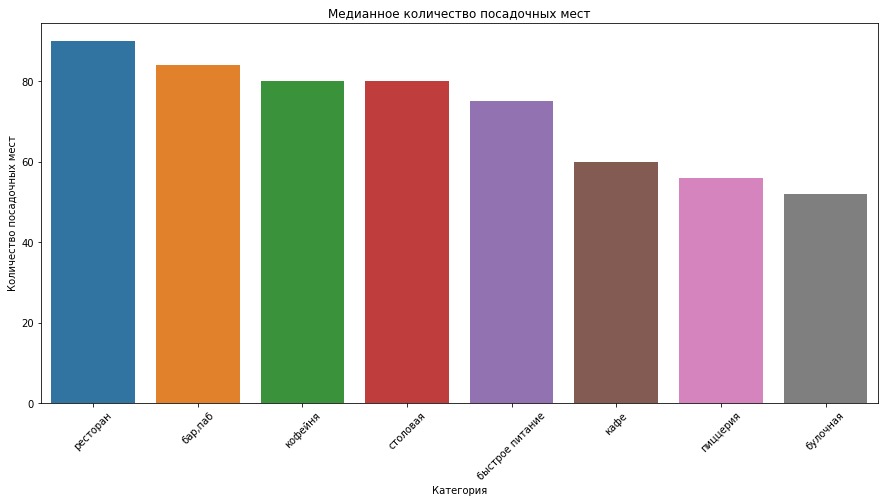

In [20]:
plt.figure(figsize=(15,7))

bar_seats = sns.barplot(x='category', y='median', data=seats)

bar_seats.set_xlabel('Категория')
bar_seats.set_ylabel('Количество посадочных мест')
bar_seats.set_title('Медианное количество посадочных мест')
plt.xticks(rotation=45)
plt.show()

Лидируют по количеству посадочных мест в медианных значениях рестораны (90 мест) и бары/пабы (84 места). Меньше всего посадочных мест - у пиццерий и булочных (56 и 52 места, соответсвенно).

**3. Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.**

In [21]:
chain = df.groupby('chain')['name'].count().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5199
1,1,3203


In [22]:
fig_chain= go.Figure(data=[go.Pie(labels=chain['chain'], values=chain['count'])], layout=go.Layout(title=go.layout.Title(text='Соотношение сетевых и несетевых заведений')))
fig_chain.show() 

Только 38,1% из всех заведений Москвы являются сетевыми, остальные 61,9% - несетевые. Нетевых заведений почти в два раза больше чем сетевых.

**4. Исследуем какие категории заведений чаще являются сетевыми.**

In [23]:
chain_category = df[df['chain'] == 1].groupby('category')['name'].count().reset_index()
chain_category.columns = ['category', 'count']
chain_category = chain_category.sort_values(by='count', ascending=False)
chain_category

,category,count
3,кафе,779
6,ресторан,729
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",168
1,булочная,157
7,столовая,88


In [24]:
merged = category.merge(chain_category, on=['category'], how='left')
merged.columns = ['category', 'total', 'total_chain']
merged['share'] = (merged['total_chain'] / merged['total'] * 100).round(2)
merged = merged.sort_values(by='share', ascending=False)
merged

,category,total,total_chain,share
7,булочная,256,157,61.33
4,пиццерия,633,330,52.13
2,кофейня,1413,720,50.96
5,быстрое питание,603,232,38.47
1,ресторан,2042,729,35.70
0,кафе,2376,779,32.79
6,столовая,315,88,27.94
3,"бар,паб",764,168,21.99


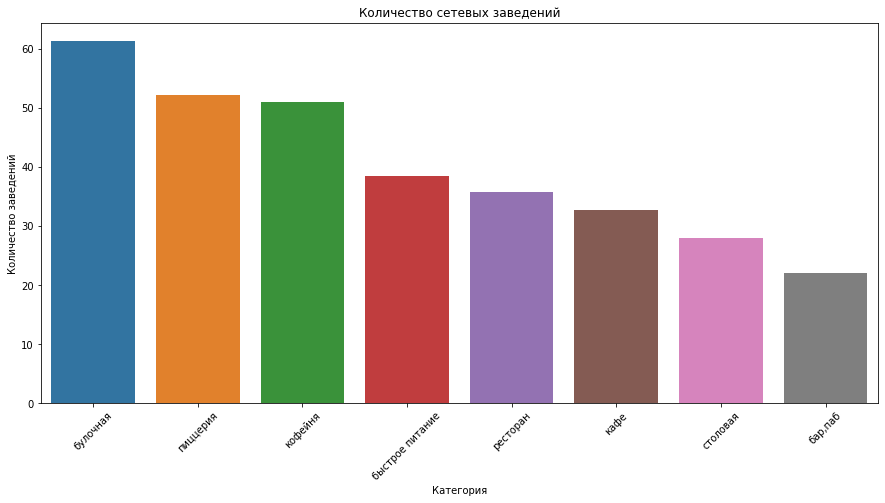

In [25]:
plt.figure(figsize=(15,7))

bar_chain_category = sns.barplot(x='category', y='share', data=merged)

bar_chain_category.set_xlabel('Категория')
bar_chain_category.set_ylabel('Количество заведений')
bar_chain_category.set_title('Количество сетевых заведений')
plt.xticks(rotation=45)
plt.show()

Наибольшая доля всех булочных (61%) являются сетевыми. Далее по убыванию доли сетевых заведений идут пиццерии (52%) и кофейни (50%).

**5. Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью будем понимать количество заведений этой сети в регионе. Построим визуализацию и найдем признак, который их объединяет.**

In [26]:
name = df[df['chain'] == 1].groupby('name').agg({'category':pd.Series.mode,'address':'count'}).reset_index()
name.columns = ['name', 'category', 'count']
name = name.sort_values(by='count', ascending=False).head(15)
name

,name,category,count
729,шоколадница,кофейня,120
335,домино'с пицца,пиццерия,76
331,додо пицца,пиццерия,74
146,one price coffee,кофейня,71
742,яндекс лавка,ресторан,69
58,cofix,кофейня,65
168,prime,ресторан,50
664,хинкальная,кафе,44
409,кофепорт,кофейня,42
418,кулинарная лавка братьев караваевых,кафе,39


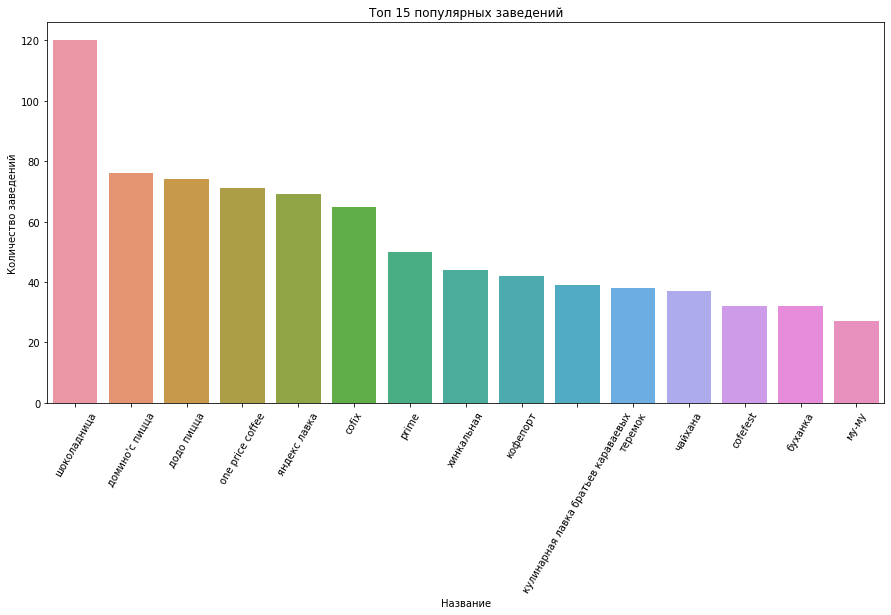

In [27]:
plt.figure(figsize=(15,7))

bar_name = sns.barplot(x='name', y='count', data=name)

bar_name.set_xlabel('Название')
bar_name.set_ylabel('Количество заведений')
bar_name.set_title('Топ 15 популярных заведений')
plt.xticks(rotation=60)
plt.show()

В тройку самых популярных заведений Москвы (с точки зрения количества сетевых заведений) попадают Шоколадница (120 шт), Доминос Пицца (76 шт) и Додо Пицца (74 шт). Большинство заведений из рейтинга мне знакомо, т.к. они представляют сетки по многим городам России, включая мой родной город - Санкт-Петербург. Большинство заведений из топ-15 являются кофейнями и неудивтельно, почему их наибольшее количество: для них не нужно много места в помещении (достаточны прилавок и пару-тройку столиков).

**6. Узнаем какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.**

In [28]:
district = df.groupby('district')['name'].count().reset_index()
district.columns = ['district', 'count']
district.sort_values(by='count', ascending=False)

,district,count
5,Центральный административный округ,2242
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [29]:
district_category = df.groupby(['district', 'category'])['name'].count().reset_index()
district_category.columns = ['district', 'category', 'count']
district_top = district_category[district_category['district'].isin(district['district'])]
district_top = district_top.sort_values('count', ascending=False)
district_top.head(10)

,district,category,count
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
3,Восточный административный округ,кафе,272
27,Северо-Восточный административный округ,кафе,269
67,Южный административный округ,кафе,264
11,Западный административный округ,кафе,238
59,Юго-Западный административный округ,кафе,238


In [30]:
district_top_fig = px.bar(district_top, x='count', y='district', color='category')

district_top_fig.update_layout(title='Количество заведений по районам Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                 )
district_top_fig.show()

На фоне остальных округов по графику сильно выделяется Центральный округ, где наибольшую долю заведений составляют рестораны (670 шт). На втором месте - Северный округ, в котором преимущественно располагаются кафе (234 шт). На третьем - Южный округ, где больше всего также кафе (264 шт). Меньше всего заведений в Северо-Западном округе - всего 409 шт.

**7. Визуализируем распределение средних рейтингов по категориям заведений.**

In [31]:
rating = df.groupby('category')['rating'].mean().reset_index().round(2)
rating.columns = ['category', 'rating']
rating = rating.sort_values(by='rating', ascending=False)
rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


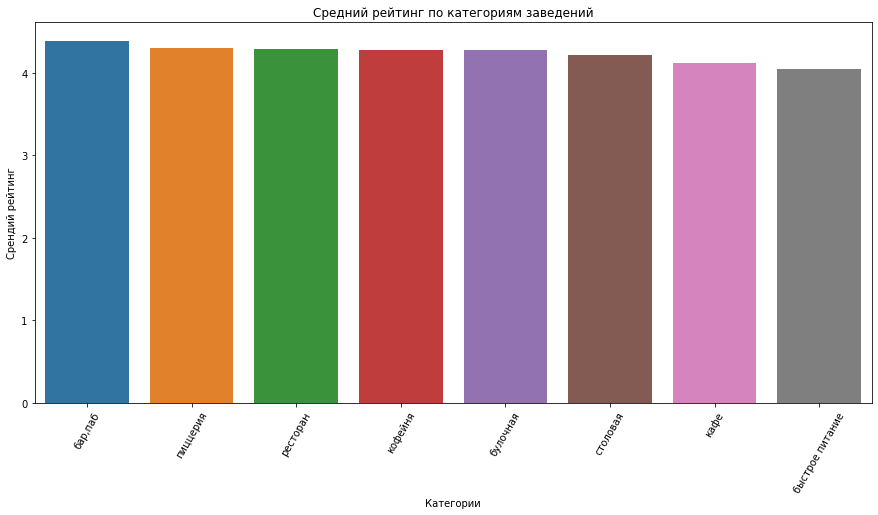

In [32]:
plt.figure(figsize=(15,7))

bar_rating = sns.barplot(x='category', y='rating', data=rating)

bar_rating.set_xlabel('Категории')
bar_rating.set_ylabel('Срендий рейтинг')
bar_rating.set_title('Средний рейтинг по категориям заведений')
plt.xticks(rotation=60)
plt.show()

Самые высокие рейтинги в среднем у баров/пабов (4.39). Пониже рейтинги у пиццерий (4.30), ресторанов (4.29), коффен (4.28) и булочных (4.27). Наихудшие средние рейтинги просматриваются у заведений с категорией быстрого питания - 4.05.

**8. Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.**

In [33]:
rating_district = df.groupby('district')['rating'].mean().reset_index().round(2)
rating_district.columns = ['district', 'rating']
rating_district.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [34]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# широта и долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По построенной нам карте видно, что наивысший рейтинг заведений у Центрального округа (4.38), а наименьший - у Юго-Восточного (4.10). У остальных округов средний рейтинг колеблется от 4.15 до 4.24.

**9. Отобразим все заведения датасета на карте с помощью кластеров.** 

In [35]:
# широта и долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

По полученной карте можно сделать вывод, что чем ближе к центру, тем больше заведений.

**10. Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.**

In [36]:
street = df.groupby('street')['name'].count().reset_index()
street.columns = ['street','count']
street = street.sort_values(by='count', ascending=False).head(15)
street

,street,count
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [37]:
street_category = df.groupby(['street', 'category'])['name'].count().reset_index()
street_category.columns = ['street', 'category', 'count']
street_top = street_category[street_category['street'].isin(street['street'])]
street_top = street_top.sort_values('count', ascending=False)
street_top.head(10)

,street,category,count
2137,проспект мира,кафе,53
1520,мкад,кафе,45
2140,проспект мира,ресторан,45
2138,проспект мира,кофейня,36
2149,профсоюзная улица,кафе,35
1313,ленинский проспект,ресторан,33
2125,проспект вернадского,ресторан,33
1305,ленинградское шоссе,ресторан,26
1381,люблинская улица,кафе,26
1310,ленинский проспект,кафе,26


In [38]:
street_top_fig = px.bar(street_top, x='count', y='street', color='category')

street_top_fig.update_layout(title='Топ 15 популярных улиц',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
street_top_fig.show()

Самой популярной улицей по количеству заведений является проспект Мира, где насчитывается 183 заведения, 53 из которых - кафе. Вторая по популярности - Профсоюзная улица (122 заведения), где также располагаются много кафе. Наименьшее количество заведений расположено на Пятницкой улице: там их всего 48.

**11. Найдем улицы, на которых находится только один объект общепита.**

In [39]:
street_one = df['street'].value_counts().reset_index()
street_one.columns = ['street', 'count']
street_one = street_one[street_one['count'] == 1]
street_one.head(10)

,street,count
990,№ 7,1
991,сторожевая улица,1
992,2-й квартал капотня,1
993,улица россолимо,1
994,мясницкий проезд,1
995,улица водников,1
996,3-й михалковский переулок,1
997,малый златоустинский переулок,1
998,1-й новокузнецкий переулок,1
999,троилинский переулок,1


In [40]:
street_one_category = street_category[street_category['street'].isin(street_one['street'])]
street_one_category = street_one_category.groupby('category')['street'].count().reset_index()
street_one_category.columns = ['category', 'count']
street_one_category = street_one_category.sort_values(by='count', ascending=False)
street_one_category

,category,count
3,кафе,159
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


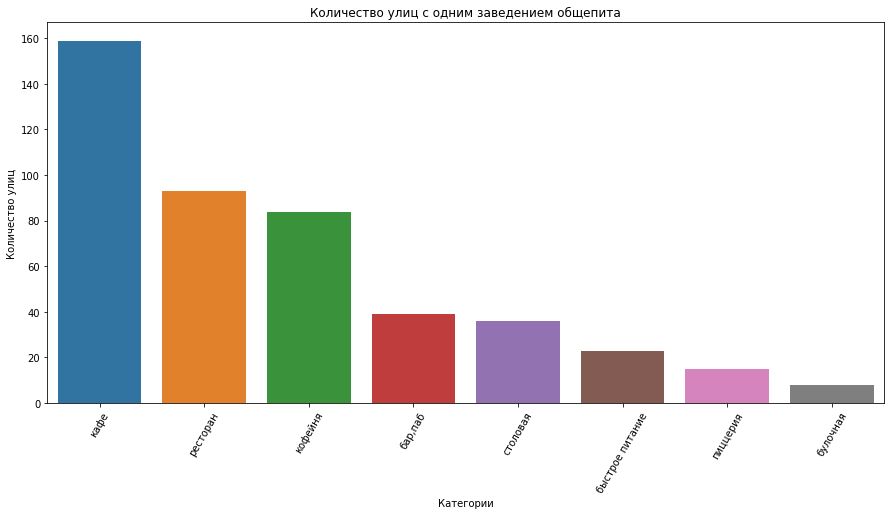

In [41]:
plt.figure(figsize=(15,7))

bar_street_one = sns.barplot(x='category', y='count', data=street_one_category)

bar_street_one.set_xlabel('Категории')
bar_street_one.set_ylabel('Количество улиц')
bar_street_one.set_title('Количество улиц с одним заведением общепита')
plt.xticks(rotation=60)
plt.show()

Улиц, на которых расположено одно заведение общепита, насчитывается 457 в Москве. Эти заведения, как правильно, - кафе. Таких "одиночных" кафе на улицах 159 штук.

**12. Построим фоновую картограмму (хороплет) с медианными значения средних чеков для каждого района. Проанализируем цены в центральном административном округе и других.**

In [42]:
median_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [43]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие значения медианных чеков у Центрального и Западного округов - 1000 руб. По расцветке карты видно, что у заведений остальных округов средний чек гораздо ниже - 450-700 руб. 

**13. Общий вывод**

- Бо́льшую долю заведений в Москве занимают кафе, рестораны и кофейни, а самую малую - столовые и булочные;

- Лидируют по количеству посадочных мест в медианном значении бары/пабы и рестораны. Меньше всего посадочных мест - у пиццерий и булочных;

- Нетевых заведений почти в два раза больше чем сетевых;

- Чаще всего сетевыми являются булочные, пиццерии и кофейни;

- Топ 3 самых популярных сеток с точки зрения количества заведений: Шоколадница, Доминос Пицца и Додо Пицца;

- Наибольшее количество заведений находится в Центральном округе, в особенности - рестораны. Меньше всего заведений в Северо-Западном округе;

- Самые высокие рейтинги в среднем - у баров/пабов, а самые низкие - у заведений с категорией быстрого питания;

- Лучшие рейтинги ставят заведениям из Центрального округа, а худшие - заведениям в у Юго-Восточном округе. У остальных округов средний рейтинг колеблется от 4.15 до 4.24;

- Чем ближе к центру города - тем больше концентрация заведений;

- Проспект Мира - самая популярная улица по количеству заведений. Наименьшее количество заведений расположено на Пятницкой улице;

- В Москве 457 улиц с единственным заведением общепита. Эти заведения, как правильно, - кафе;

- Самые высокие значения медианных чеков у Центрального и Западного округов.

## Детализация исследования: открытие кофейни

**1. Узнаем сколько всего кофеен в датасете: в каких районах их больше всего и каковы особенности их расположения.**

In [44]:
coffee = df[df['category'] == 'кофейня']
print('Количество кофеен в Москве:', len(coffee))

Количество кофеен в Москве: 1413


In [45]:
coffee_district = coffee.groupby('district')['name'].count().reset_index()
coffee_district.columns = ['district', 'count']
coffee_district['share'] = round(coffee_district['count'] / len(coffee) * 100, 2)
coffee_district = coffee_district.sort_values(by='count', ascending=False)
coffee_district

,district,count,share
5,Центральный административный округ,428,30.29
2,Северный административный округ,193,13.66
3,Северо-Восточный административный округ,159,11.25
1,Западный административный округ,150,10.62
8,Южный административный округ,131,9.27
0,Восточный административный округ,105,7.43
7,Юго-Западный административный округ,96,6.79
6,Юго-Восточный административный округ,89,6.30
4,Северо-Западный административный округ,62,4.39


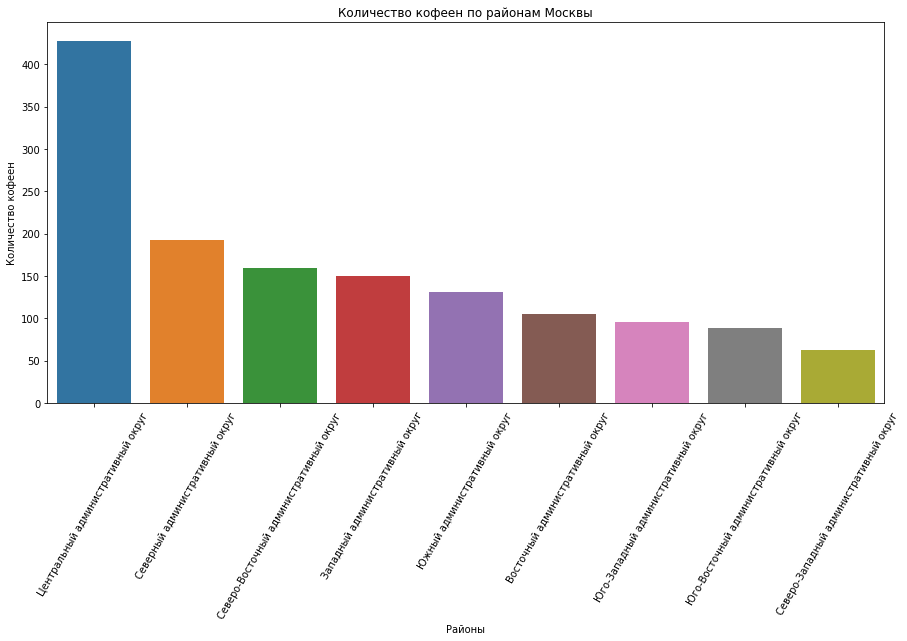

In [46]:
plt.figure(figsize=(15,7))

bar_coffee_district = sns.barplot(x='district', y='count', data=coffee_district)

bar_coffee_district.set_xlabel('Районы')
bar_coffee_district.set_ylabel('Количество кофеен')
bar_coffee_district.set_title('Количество кофеен по районам Москвы')
plt.xticks(rotation=60)
plt.show()

Наибольшая доля кофеен (30,3%) расположена в Центральном округе. Далее идут Северный (13,7%) и Северо-Восточный (11,3%) округа. Меньше всего кофеен расположено в Северо-Западном округе (4,39%).

**2. Рассмотрим наличие круглосуточных кофеен**

In [47]:
coffee_is_24_7 = coffee[coffee['is_24_7'] == True]
print('Количество круглосуточных кофеен в Москве:', len(coffee_is_24_7))

Количество круглосуточных кофеен в Москве: 59


**3. Рассмотрим рейтинги кофеен и их расположение по районам**

In [48]:
coffee_rating = coffee.groupby('district')['rating'].mean().reset_index().round(2)
coffee_rating.sort_values('rating', ascending=False)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги ставят кофейням в Центральном и Северо-Западном округе.

**4. Узнаем на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни**

In [50]:
middle_coffee_cup = coffee.groupby('district')['middle_coffee_cup'].mean().reset_index().round(2)
middle_coffee_cup.sort_values('middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [51]:
print('Средняя цена одной чашки капучино по районам Москвы:', middle_coffee_cup['middle_coffee_cup'].mean())

Средняя цена одной чашки капучино по районам Москвы: 171.32


In [52]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Самые высокие цены одной чашки капучино в Западном, Центральном и Юго-Западном округах.

**Вывод:**

Всего в Москве открыто 1413 кофеен, 59 из которых работают круглосуточно и ежедневно.

Самые высокие рейтинги у кофеен, расположенных с Центральном и Северо-Западном округах.

Самая дорогая чашка капучино в Центральном, Западном, Юго-Западном округах.

Рекомендации для открытия кофейни:

- В Центральном округе наивысшие рейтинги и цены в заведениях (в том числе и у кофее). Кроме того, конкуренция также наивысшая - в этом округе самая высокой концентрация кофеен в Москве, следовательно - и спрос. Стоит задуматься об открытии кофейни именно в этом районе. Но из-за уровня конкуренции инвесторам следует хорошо вложиться, чтобы занять хорошую нишу на рынке и быстро окупиться.

- Открывать кофейню, которая бы работала 24/7 нет особо смысла, т.к. кофе практически никто не пьет вечером или ночью. Часы работы следует выбрать обычные: где-то с 7 или 8 утра.

- Посадочных мест у кофеен в среднем 80 в заведении. Думаю, что стоит ориентироваться на это значение при открытии кофейни.

- Средняя цена за чашку капучино по всем районам Москвы - 171 руб, а преимущественно в Центральном округе - 187 руб.

## Презентация

Презентация: https://disk.yandex.ru/i/vAlNSbbFtl0TOg

## Общий вывод

Первый **этап загрузки данных** показал нам датасет с информацией о заведениях общественного питания Москвы на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

В датасете 14 столбцов и 8406 строк.

Нам представлено 5614 уникальных заведений Москвы, а также описание каждого из них: адрес, категория заведения, дни и часы работы, долгота и широта, рейтинг заведения, категория цен, средняя стоимость заказа, число с оценкой среднего чека, число с оценкой одной чашки капучино, наличие сетевого заведения, административный район, количество посадочных мест.

____________________

На этапе **предобработки данных** мы избавились от 4 неявных строк-дубликатов, заранее отфильтровав их по названию и адресу заведения. После удаления дубликатов количество уникальных заведений Москвы в данных сократилось до 5512 шт.

Наблюдаются пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats. Принято решение пропуски не удалять и не заменять, т.к. они занимают значительную долю в данных и есть вероятность сильно исказить этим выводы.

Далее мы создали 2 дополнительных столбца street (названия улиц) и is_24_7 (обозначения, что заведение работает ежедневно и круглосуточно).

____________________

На этапе **анализа данных** мы выявили, что:

- Бо́льшую долю заведений в Москве занимают кафе, рестораны и кофейни, а самую малую - столовые и булочные;

- Лидируют по количеству посадочных мест в медианном значении бары/пабы и рестораны. Меньше всего посадочных мест - у пиццерий и булочных;

- Нетевых заведений почти в два раза больше чем сетевых;

- Чаще всего сетевыми являются булочные, пиццерии и кофейни;

- Топ 3 самых популярных сеток с точки зрения количества заведений: Шоколадница, Доминос Пицца и Додо Пицца;

- Наибольшее количество заведений находится в Центральном округе, в особенности - рестораны. Меньше всего заведений в Северо-Западном округе;

- Самые высокие рейтинги в среднем - у баров/пабов, а самые низкие - у заведений с категорией быстрого питания;

- Лучшие рейтинги ставят заведениям из Центрального округа, а худшие - заведениям в у Юго-Восточном округе. У остальных округов средний рейтинг колеблется от 4.15 до 4.24;

- Чем ближе к центру города - тем больше концентрация заведений;

- Проспект Мира - самая популярная улица по количеству заведений. Наименьшее количество заведений расположено на Пятницкой улице;

- В Москве 457 улиц с единственным заведением общепита. Эти заведения, как правильно, - кафе;

- Самые высокие значения медианных чеков у Центрального и Западного округов.

__________________

На завершающем этапе мы провели **детализацию исследования в случае открытия кофейни**. 

- Всего в Москве открыто 1413 кофеен, 59 из которых работают круглосуточно и ежедневно;

- Самые высокие рейтинги у кофеен, расположенных с Центральном и Северо-Западном округах;

- Самая дорогая чашка капучино в Центральном, Западном, Юго-Западном округах.

В конце были даны рекомендации по открытию кофейни:

- В Центральном округе наивысшие рейтинги и цены в заведениях (в том числе и у кофее). Кроме того, конкуренция также наивысшая - в этом округе самая высокой концентрация кофеен в Москве, следовательно - и спрос. Стоит задуматься об открытии кофейни именно в этом районе. Но из-за уровня конкуренции инвесторам следует хорошо вложиться, чтобы занять хорошую нишу на рынке и быстро окупиться.

- Открывать кофейню, которая бы работала 24/7 нет особо смысла, т.к. кофе практически никто не пьет вечером или ночью. Часы работы следует выбрать обычные: где-то с 7 или 8 утра.

- Посадочных мест у кофеен в среднем 80 в заведении. Думаю, что стоит ориентироваться на это значение при открытии кофейни.

- Средняя цена за чашку капучино по всем районам Москвы - 171 руб, а преимущественно в Центральном округе - 187 руб.